## Filtering Labels

Mobile SAM can return (potentially) hundreds or thousands of labels.   Many of the labels may not be of interest.  There are a couple of potential ways to deal with this. 

1.  Train the prompt detector to also classify objects (for example YOLO can be trained to classify) then only keep the prompts corresponding to classes of interest. 

2.  Filter the labels by a criteria so we only keep objects of interest.  

This example shows the latter strategy. 

In [1]:
from segment_everything.detect_and_segment import segment_from_stacked_labels
from segment_everything.prompt_generator import YoloDetector
from segment_everything.weights_helper import get_weights_path
from segment_everything.stacked_labels import StackedLabels
from segment_everything.detect_and_segment import segment_from_stacked_labels
import matplotlib.pyplot as plt
from tnia.plotting.plt_helper import random_label_cmap, mask_overlay, imshow_multi2d
import numpy as np
from skimage.io import imread
import os

c:\Users\bnort\miniconda3\envs\pytorch_and_SAM3\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Create a Yolo Detector

In [2]:
conf = 0.2
iou = 0.8
imagesz = 2048
descriptor = "MobileSAM Model"
boxes = True

yolo_detecter = YoloDetector(str(get_weights_path("ObjectAwareModel")), "ObjectAwareModelFromMobileSamV2", device='cuda')
        

### Load a test image

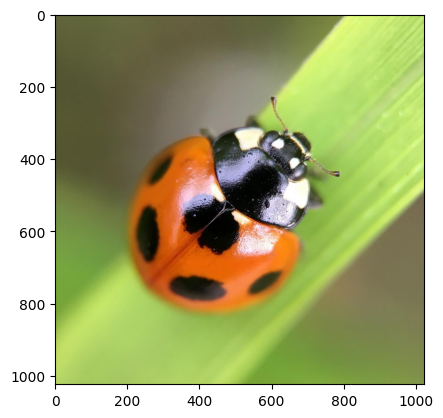

In [3]:

data_path = r'../../data'
parent_path = os.path.join(data_path, 'ladybugs_SAM')
#image_name = os.path.join(parent_path, '5784124_7185843.jpg')
image_name = os.path.join(parent_path, '6337689_7986324.jpg')
img = imread(image_name)
plt.imshow(img)

overlay_path = os.path.join(parent_path, 'overlays')

if not os.path.exists(overlay_path):
    os.makedirs(overlay_path)

### Call Yolo then SAM

1.  First we call Yolo to get bounding boxes
2.  Then we create a 'StackedLabels' object from the bounding boxes
3.  Then we use the 'StackedLabels' API to segment using 'MobileSAMV2'
4.  Then we order masks largest to smallest.
5.  Now a min projection will show small objects on top (because they have larger indexes. )

In [4]:
results = yolo_detecter.get_results(img, conf=conf, iou= iou, imgsz=imagesz, max_det=10000)
bbs=results[0].boxes.xyxy.cpu().numpy()
stacked_labels = StackedLabels.from_yolo_results(bbs, None, img)
segmented_stacked_labels = segment_from_stacked_labels(stacked_labels, "MobileSamV2")
segmented_stacked_labels.sort_largest_to_smallest()
labels = segmented_stacked_labels.make_2d_labels(type="min")
        


0: 2048x2048 23 objects, 152.6ms
Speed: 28.9ms preprocess, 152.6ms inference, 67.8ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully


### Show Original and Segmented

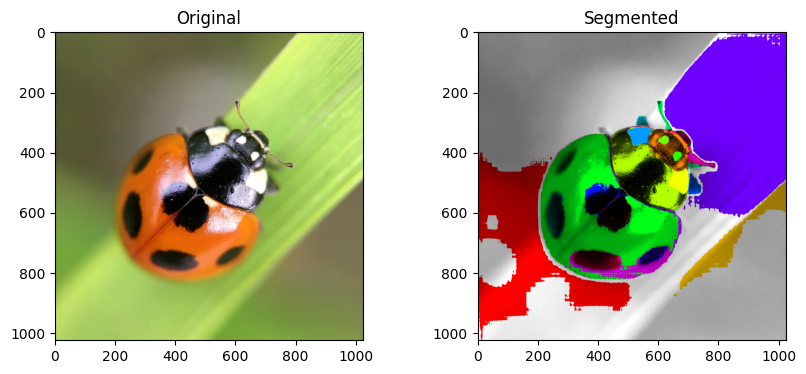

In [5]:
overlay_img = mask_overlay(img, labels)

#plt.imshow(overlay_img, cmap=random_label_cmap())
fig = imshow_multi2d([img, overlay_img], ["Original", "Segmented"], 1, 2)

### Use helpers to filter objects. 

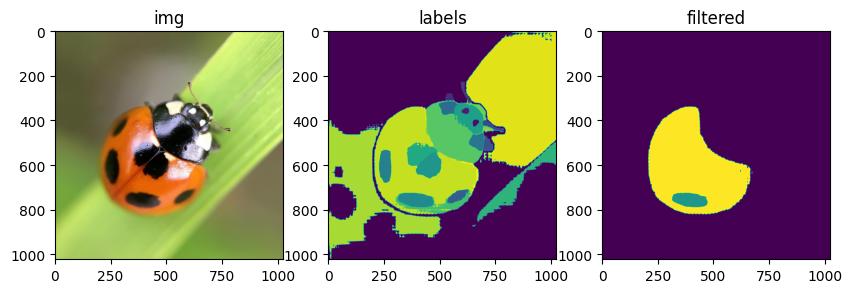

In [ ]:
stat_limits = {
    "area": {"min": 0, "max": 100000000},
    "label_num": {"min": -100000000, "max": 10000000000},
    "solidity": {"min": 0.0, "max": 1.0},
    "circularity": {"min": 0.4, "max": 1.0},
    "mean_intensity": {"min": 0, "max": 255},
    "10th_percentile_intensity": {"min": 0, "max": 255},
    "mean_hue": {"min": 0, "max": 360},
    "mean_saturation": {"min": 0.0, "max": 1000},
    "predicted_iou": {"min": 0.0, "max": 1.0},
    "stability_score": {"min": 0.0, "max": 1.0}
}

segmented_stacked_labels.add_properties_to_label_image()

_2d_labels = segmented_stacked_labels.make_2d_labels(type="min")

segmented_stacked_labels.filter_labels_3d_multi(stat_limits)
segmented_stacked_labels.filter_labels_hue_inverse(30, 330)
_2d_labels_filtered = segmented_stacked_labels.make_2d_labels(type="min")

test = mask_overlay(img, _2d_labels)
fig = imshow_multi2d([img, _2d_labels, _2d_labels_filtered], ['img', 'labels', 'filtered'], 1 ,3)


## Explore labels in 3D

In [75]:
import napari
from  napari_segment_everything import segment_everything

viewer = napari.Viewer()
segment_everything_widget=segment_everything.NapariSegmentEverything(viewer)
viewer.window.add_dock_widget(segment_everything_widget)
segment_everything_widget.load_project(segmented_stacked_labels.image, segmented_stacked_labels.mask_list)
layer = viewer.layers['SAM 3D labels']
image_layer = viewer.layers['image']
layer.scale = [10, 1, 1]
layer.translate = [-10*len(segmented_stacked_labels.mask_list), 0, 0]


area 166.0 206395.0
label_num 1 43
solidity 0.01993598023249284 0.9738467126770796
circularity 0.01146839776452461 0.891755107515581
mean_intensity 13.874257771568285 251.5404556166536
10th_percentile_intensity 2.0 250.0
mean_hue 18.738092496660403 181.30021879475947
mean_saturation 9.257852128168935 222.12476670924994
predicted_iou 0.42657896876335144 1.0178486108779907
stability_score 0.0 0.9932249188423157



0: 2048x2048 37 objects, 159.1ms
Speed: 26.9ms preprocess, 159.1ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 24 objects, 181.4ms
Speed: 23.1ms preprocess, 181.4ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1024 113 objects, 158.6ms
Speed: 14.0ms preprocess, 158.6ms inference, 4.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 48 objects, 126.7ms
Speed: 21.9ms preprocess, 126.7ms inference, 2.9ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1920 144 objects, 160.0ms
Speed: 25.9ms preprocess, 160.0ms inference, 2.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 254 objects, 129.9ms
Speed: 22.1ms preprocess, 129.9ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1376x2048 87 objects, 165.5ms
Speed: 19.0ms preprocess, 165.5ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 58 objects, 125.6ms
Speed: 22.0ms preprocess, 125.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 93 objects, 129.6ms
Speed: 21.9ms preprocess, 129.6ms inference, 3.1ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1536x2048 370 objects, 148.6ms
Speed: 22.9ms preprocess, 148.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 108 objects, 127.7ms
Speed: 21.9ms preprocess, 127.7ms inference, 3.1ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1536x2048 56 objects, 129.7ms
Speed: 22.9ms preprocess, 129.7ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1376 31 objects, 155.7ms
Speed: 18.9ms preprocess, 155.7ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1536x2048 65 objects, 130.7ms
Speed: 27.9ms preprocess, 130.7ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1312x2048 176 objects, 155.6ms
Speed: 22.9ms preprocess, 155.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1856 33 objects, 160.6ms
Speed: 24.9ms preprocess, 160.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1664x2048 177 objects, 157.8ms
Speed: 22.0ms preprocess, 157.8ms inference, 3.9ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x2048 23 objects, 148.6ms
Speed: 27.0ms preprocess, 148.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 141 objects, 128.7ms
Speed: 22.9ms preprocess, 128.7ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 2048x1536 397 objects, 128.7ms
Speed: 21.9ms preprocess, 128.7ms inference, 4.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully



0: 1184x2048 127 objects, 155.6ms
Speed: 17.0ms preprocess, 155.6ms inference, 3.0ms postprocess per image at shape (1, 3, 2048, 2048)


VIT checkpoint loaded successfully


c:\users\bnort\work\imagej2022\tnia\tnia-python\tnia\plotting\plt_helper.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, cols, figsize=(width,height))


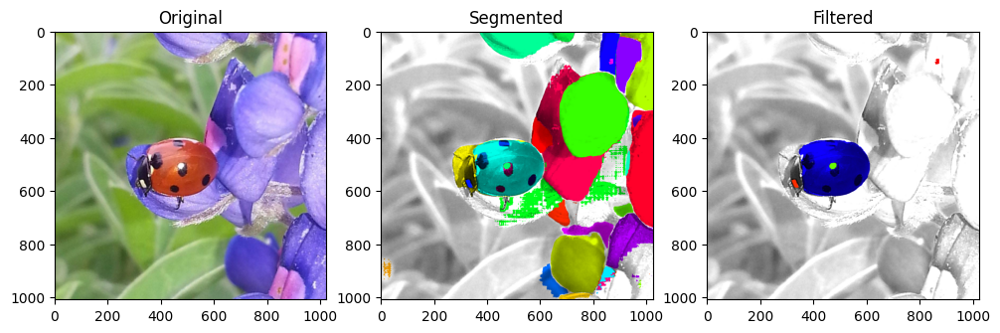

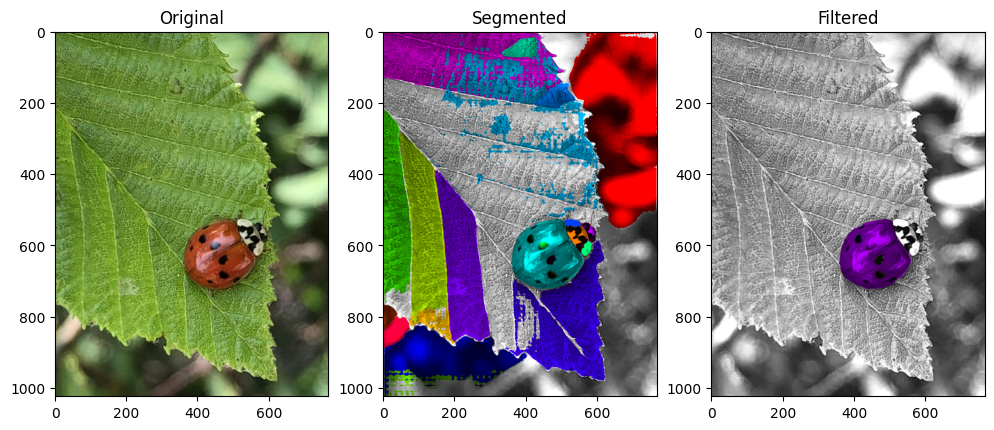

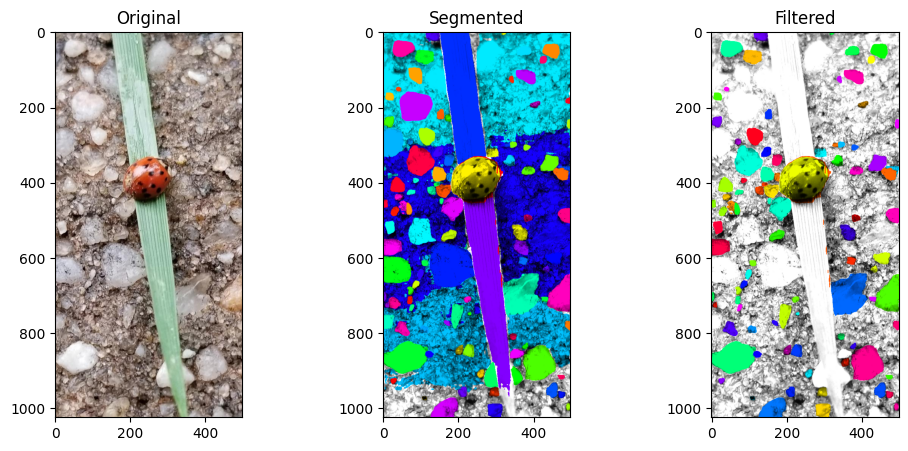

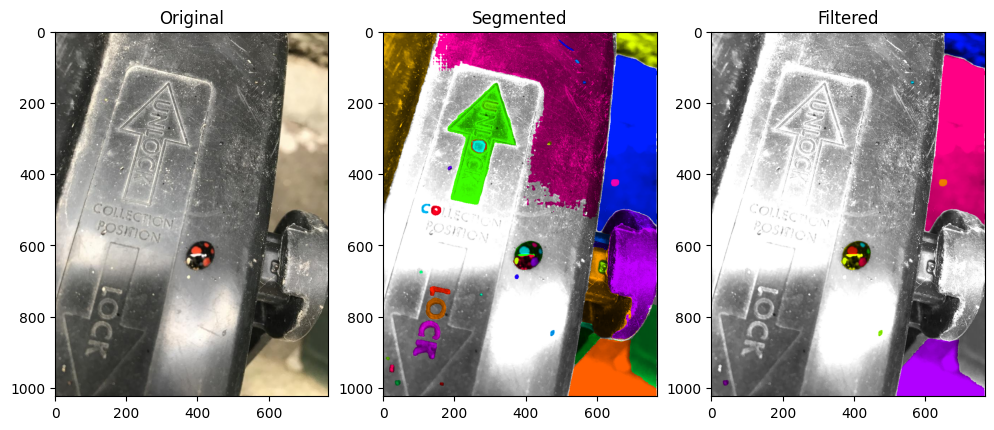

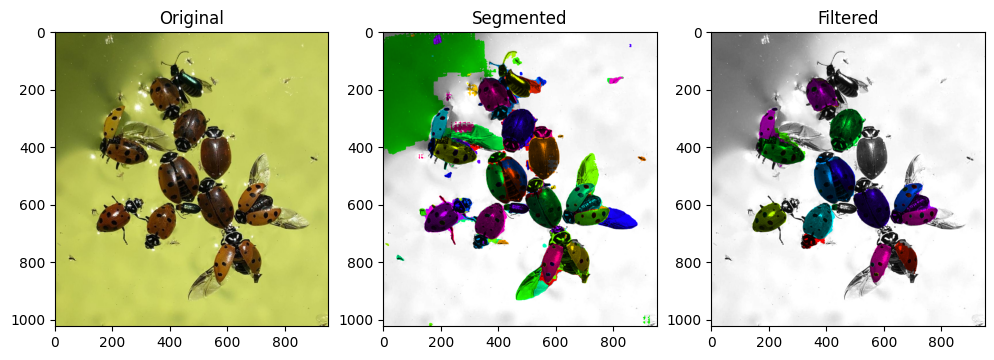

...

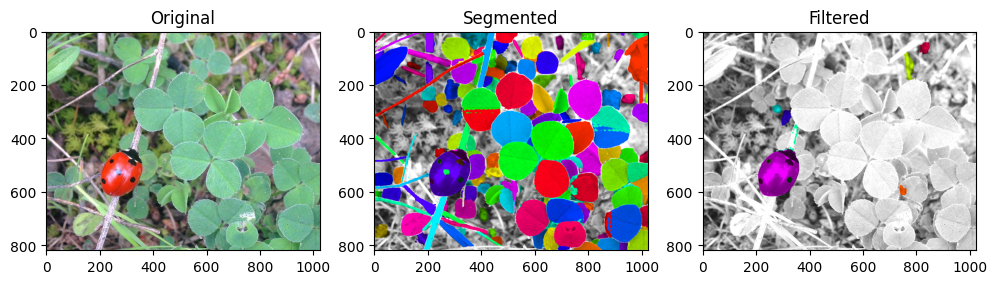

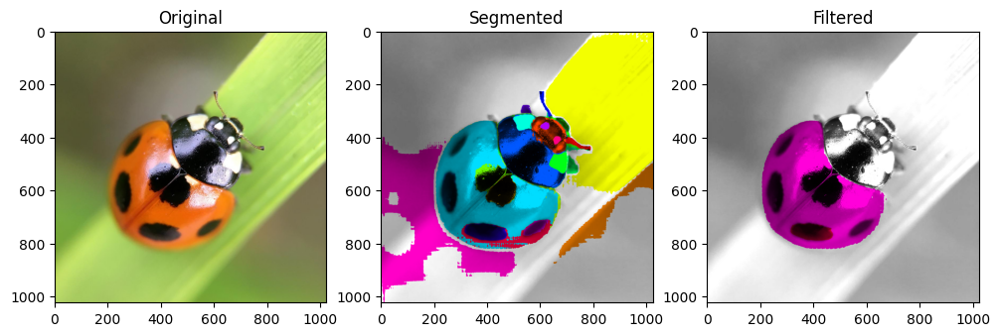

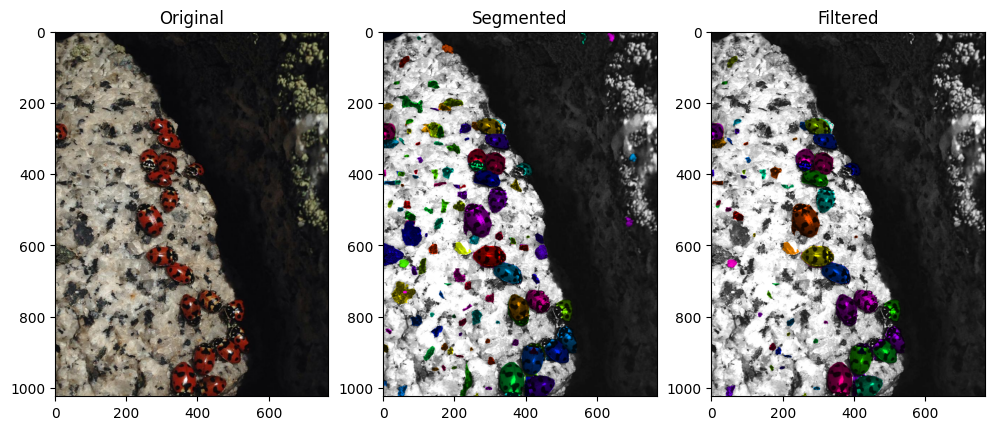

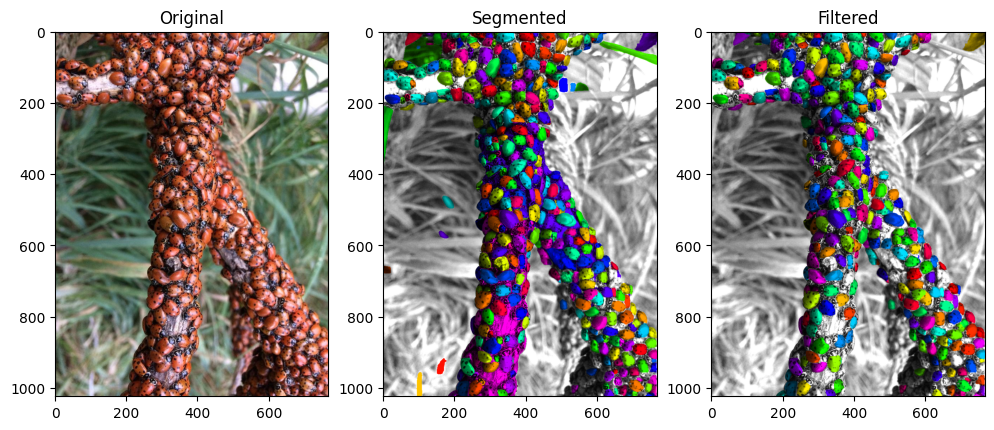

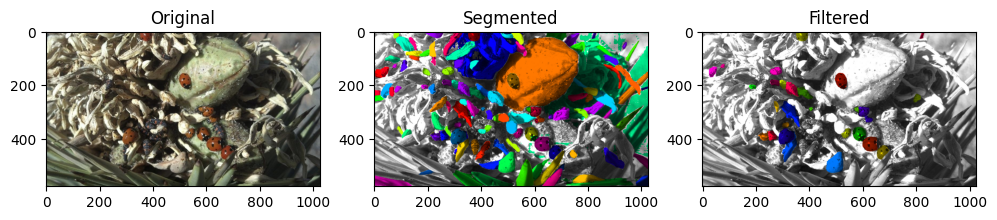

In [8]:
# get all image in parent path
import glob
import os
image_list = glob.glob(os.path.join(parent_path, '*.jpg'))

i=0
for image_name in image_list:
    img = imread(image_name)
    results = yolo_detecter.get_results(img, conf=conf, iou= iou, imgsz=imagesz, max_det=10000)
    bbs=results[0].boxes.xyxy.cpu().numpy()
    stacked_labels = StackedLabels.from_yolo_results(bbs, None, img)
    segmented_stacked_labels = segment_from_stacked_labels(stacked_labels, "MobileSamV2")
    segmented_stacked_labels.sort_largest_to_smallest()
    segmented_stacked_labels.add_properties_to_label_image()
    
    _2d_labels = segmented_stacked_labels.make_2d_labels(type="min")
    overlay = mask_overlay(img, _2d_labels)

    segmented_stacked_labels.filter_labels_3d_multi(stat_limits)
    segmented_stacked_labels.filter_labels_hue_inverse(30, 330)
    
    _2d_labels_filtered = segmented_stacked_labels.make_2d_labels(type="min")
    overlay_filtered = mask_overlay(img, _2d_labels_filtered)
    
    fig = imshow_multi2d([img, overlay, overlay_filtered], ["Original", "Segmented", "Filtered"], 1, 3, width = 12, height = 5)
    fig.savefig(os.path.join(overlay_path, f'image{i}.png'))
    i = i+1
 
    